In [5]:
! pip install grad_cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 1.0 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad_cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38241 sha256=82c723ad97df8fedcb64a69105f3546ad23465f68bd4879957342eca8efa8052
  Stored in directory: /home/dlpc01/.cache/pip/wheels/53/02/43/1f75726b5c28459596067ad91e36951463c01273eef661f09f
Successfully built grad_cam


In [45]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import splitfolders
import torch.nn.functional as F
import cv2
from sklearn import decomposition
from sklearn import manifold

In [46]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((320,240)),
#         transforms.ColorJitter(brightness=.5, hue=.3),
        transforms.RandomApply(transforms=[transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=0.25),
        transforms.RandomPerspective(distortion_scale=0.6, p=0.25),
        transforms.RandomApply(transforms=[transforms.ColorJitter(brightness=.5, hue=.3),transforms.RandomInvert()], p=0.25),
#         transforms.Grayscale(num_output_channels=3),
#         transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(0.25),
#         transforms.RandomRotation(30),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((320,240)),
#         transforms.Grayscale(num_output_channels=3),
        # transforms.Resize(256),
#         transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
data_dir = "/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2"
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=8,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #SELECT GPU FROM HERE|
device = "cpu"

torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])
torch.Size([3, 320, 240])


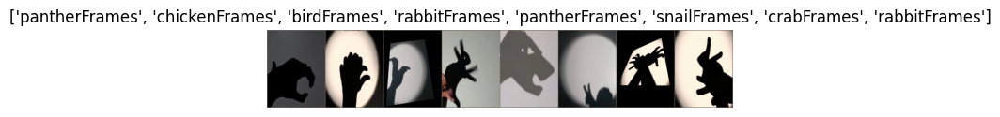

In [47]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.axis('off')
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
for i in inputs:
    print(i.shape)
# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [5]:
model = models.maxvit_t(pretrained=True)
loaded_model = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_MaxViT_1.pt')
# print(loaded_model.keys())
model.load_state_dict(loaded_model, strict=False)
model.eval().to(device)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaxVit_T_Weights.IMAGENET1K_V1`. You can also use `weights=MaxVit_T_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

MaxVit(
  (stem): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
      (2): GELU(approximate='none')
    )
    (1): Conv2dNormActivation(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
  (blocks): ModuleList(
    (0): MaxVitBlock(
      (layers): ModuleList(
        (0): MaxVitLayer(
          (layers): Sequential(
            (MBconv): MBConv(
              (proj): Sequential(
                (0): AvgPool2d(kernel_size=3, stride=2, padding=1)
                (1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
              )
              (stochastic_depth): Identity()
              (layers): Sequential(
                (pre_norm): BatchNorm2d(64, eps=0.001, momentum=0.99, affine=True, track_running_stats=True)
                (conv_a): Conv2dNormActivation(
           

In [9]:
model = models.convnext_large(pretrained=True)
loaded_model = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_ConvNextLarge.pt')
# print(loaded_model.keys())
model.load_state_dict(loaded_model, strict=False)
model.eval().to(device)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Large_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ConvNeXt(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((192,), eps=1e-06, elementwise_affine=True)
    )
    (1): Sequential(
      (0): CNBlock(
        (block): Sequential(
          (0): Conv2d(192, 192, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=192)
          (1): Permute()
          (2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
          (3): Linear(in_features=192, out_features=768, bias=True)
          (4): GELU(approximate='none')
          (5): Linear(in_features=768, out_features=192, bias=True)
          (6): Permute()
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): CNBlock(
        (block): Sequential(
          (0): Conv2d(192, 192, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=192)
          (1): Permute()
          (2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
          (3): Linear(

In [6]:
def visualize_modelMaxViT(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('ground truth: {}, predicted: {}'.format(class_names[labels[j]], class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

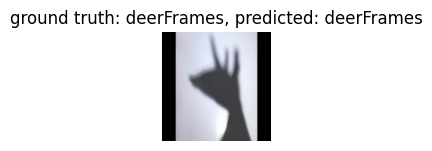

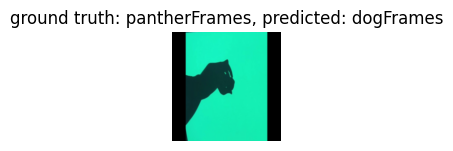

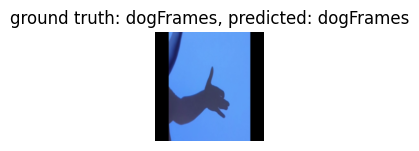

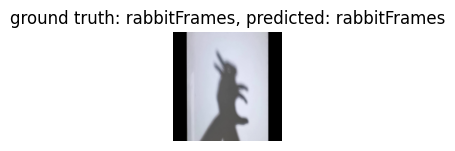

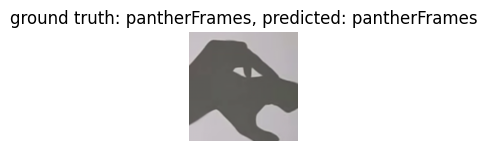

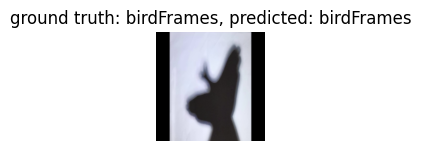

In [7]:
visualize_modelMaxViT(model)

In [48]:
def get_representations(model, iterator):

    model.eval()

    outputsList = []
    intermediatesList = []
    labelsList = []

    with torch.no_grad():
        
        for i, (inputs, labels) in enumerate(iterator):

            inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)
#             print(model(inputs))
            outputs = model(inputs)
#             _, preds = torch.max(outputs, 1)

            outputsList.append(outputs.cpu())
            labelsList.append(labels.cpu())
        
    outputsList = torch.cat(outputsList, dim = 0)
    labelsList = torch.cat(labelsList, dim = 0)

    return outputsList, labelsList

In [49]:
def plot_representations(data, labels, classes, n_images = None):
            
    if n_images is not None:
        data = data[:n_images]
        labels = labels[:n_images]
                
    fig = plt.figure(figsize = (15, 15))
    ax = fig.add_subplot(111)
#     for i in range(len(classes)):
#         for j in range (len(labels)):
#             if labels[j] == i:
#                 ax.scatter(data[j, 0], data[j, 1], c = labels[j], label = classes[labels[j]], cmap = 'hsv')
    scatter = ax.scatter(data[:, 0], data[:, 1], c = labels, cmap = 'hsv')
    handles, _ = scatter.legend_elements(prop='colors')
    legend = ax.legend(handles, classes, loc="upper right", title="Class Labels")
    #     ax.legend()
#     plt.show()

In [50]:
def get_tsne(data, n_components = 2, n_images = None):
    
    if n_images is not None:
        data = data[:n_images]
        
    tsne = manifold.TSNE(n_components = n_components, random_state = 0)
    tsne_data = tsne.fit_transform(data)
    return tsne_data

In [50]:
outputsList, labelsList = get_representations(model, dataloaders['train'])

In [10]:
outputsList, labelsList = get_representations(model, dataloaders['train'])

In [14]:
# print(outputsList, len(outputsList))
# print(labelsList, len(labelsList))
# print(output_tsne_data)
print(max(labelsList))

tensor(10)


In [76]:
output_tsne_data = get_tsne(outputsList)

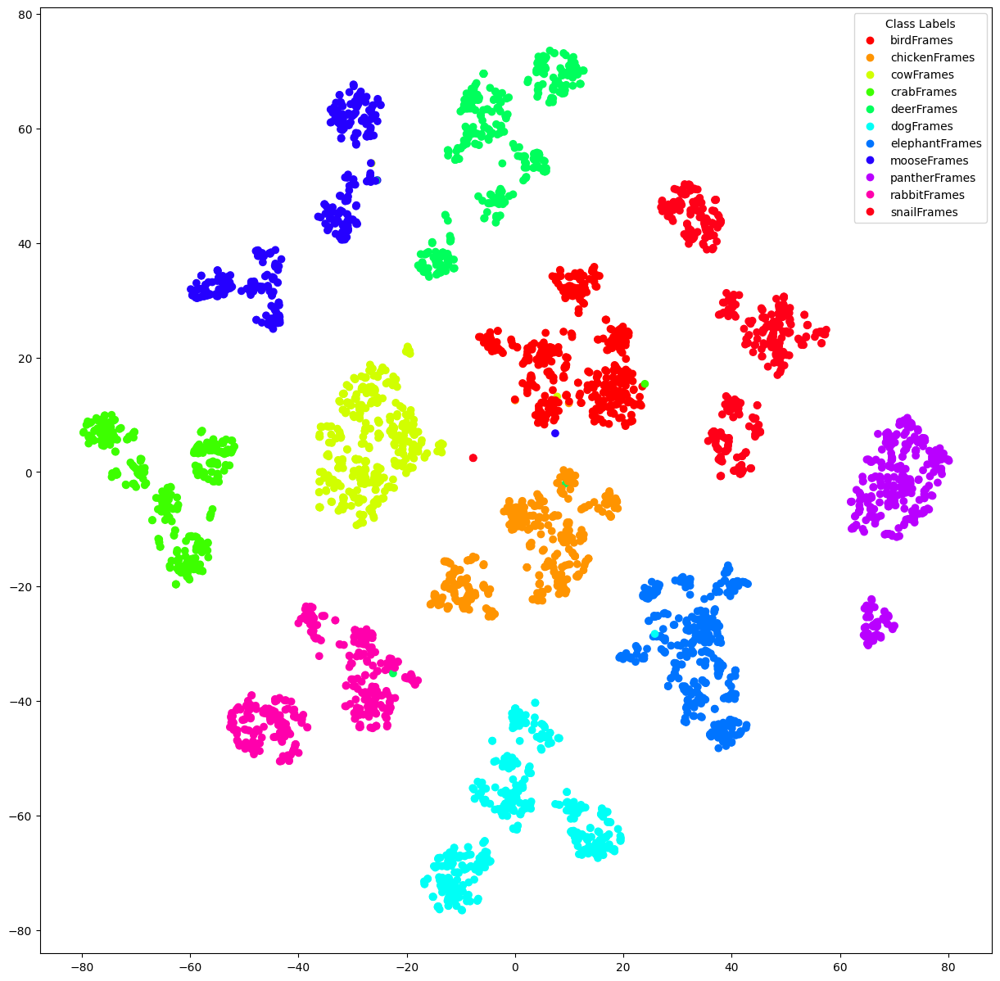

In [88]:
plot_representations(output_tsne_data, labelsList, class_names)

In [55]:
def get_pca(data, n_components = 2):
    pca = decomposition.PCA()
    pca.n_components = n_components
    pca_data = pca.fit_transform(data)
    return pca_data

In [89]:
output_pca_data = get_pca(outputsList)

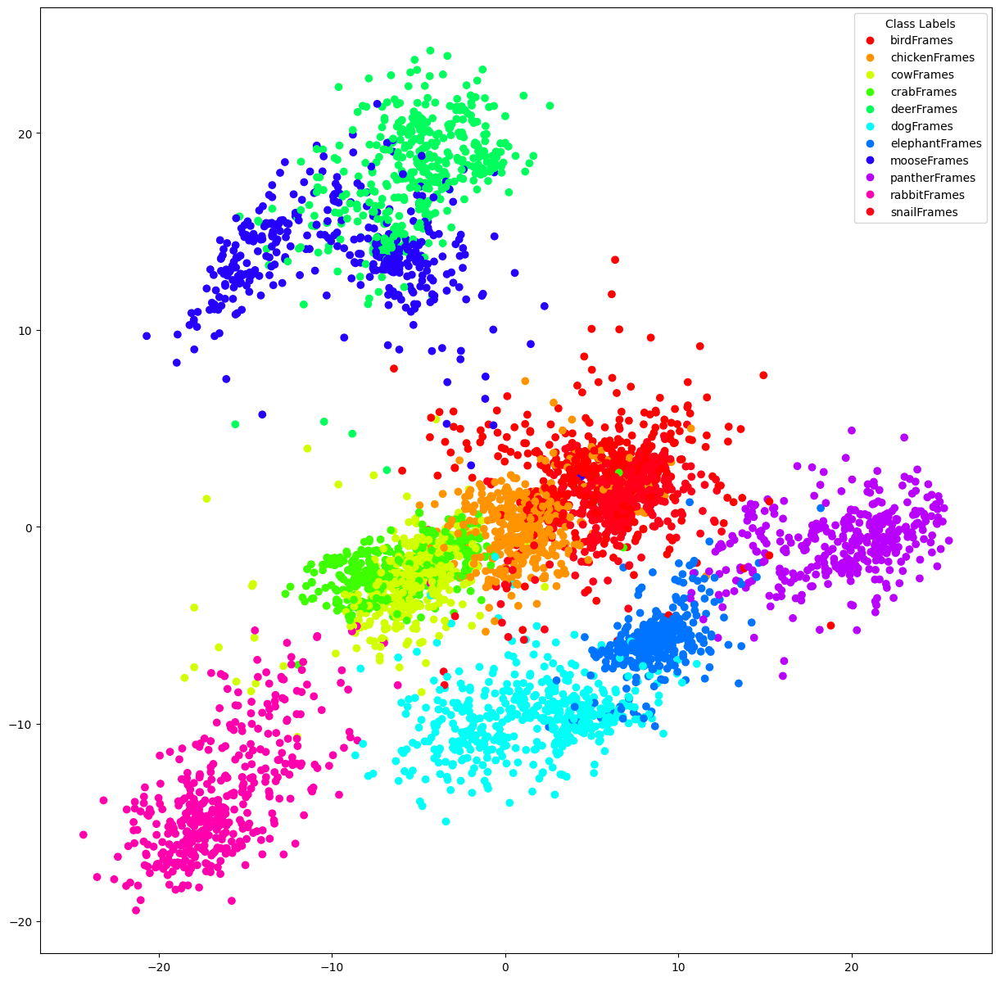

In [90]:
plot_representations(output_pca_data, labelsList, class_names)

In [7]:
model1 = models.densenet201(pretrained=True)
loaded_model1 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_DenseNet201_1.pt')
# print(loaded_model.keys())
model1.load_state_dict(loaded_model1, strict=False)
model1.eval().to(device)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [57]:
outputsList1, labelsList1 = get_representations(model1, dataloaders['train'])

In [91]:
output_tsne_data1 = get_tsne(outputsList1)

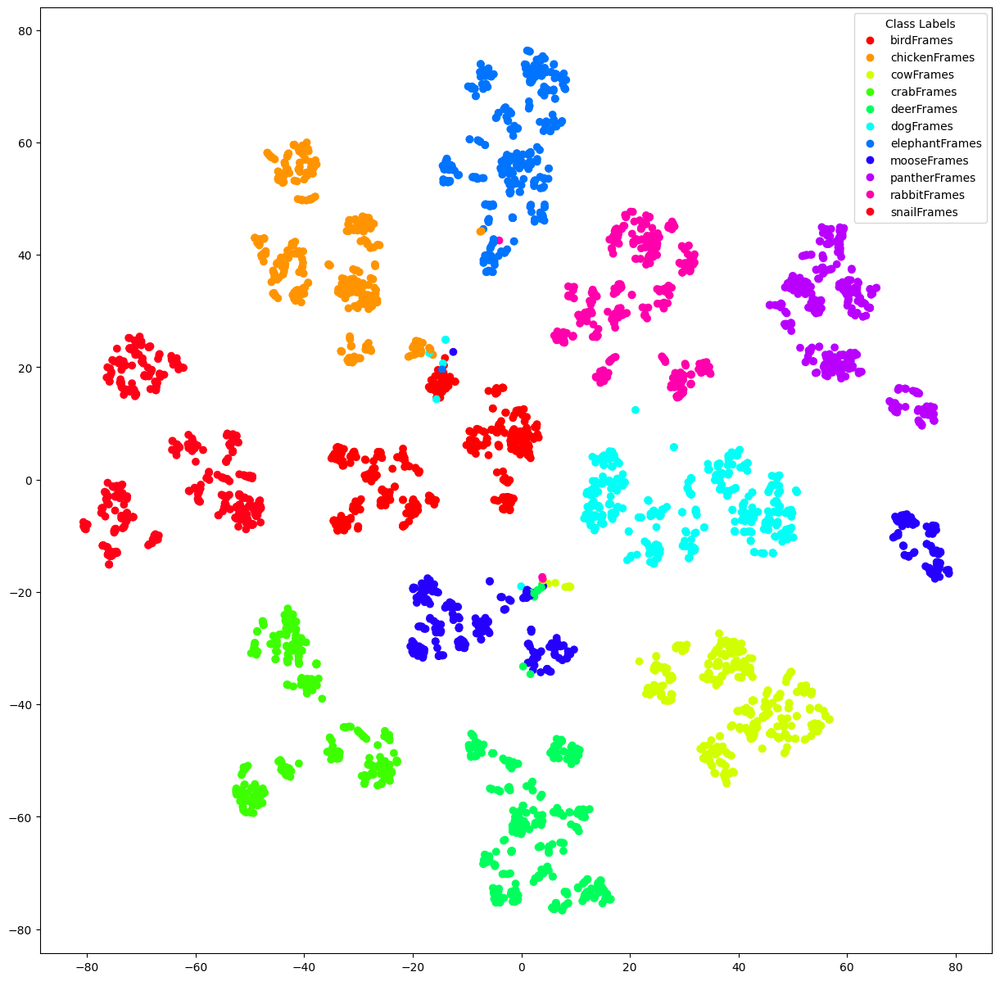

In [92]:
plot_representations(output_tsne_data1, labelsList1, class_names)

In [93]:
output_pca_data1 = get_pca(outputsList1)

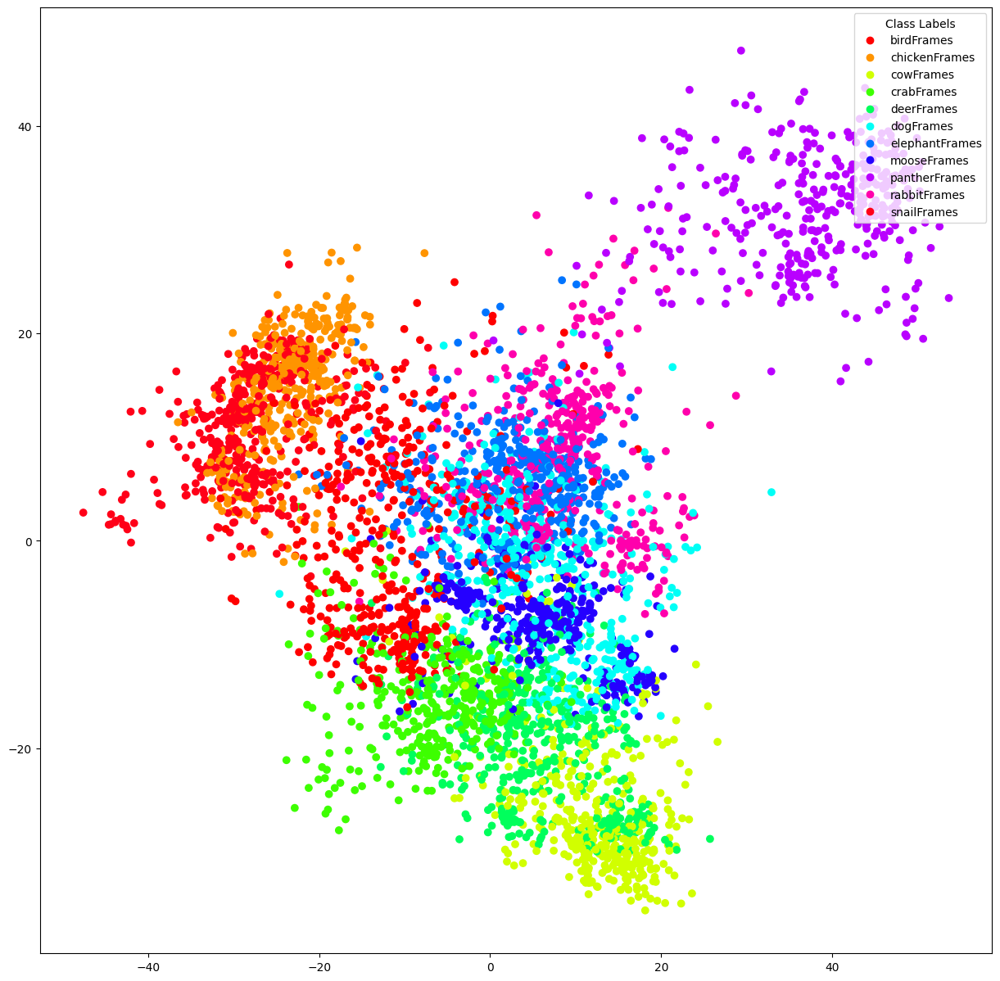

In [94]:
plot_representations(output_pca_data1, labelsList1, class_names)

In [6]:
! pip install timm-vis

In [63]:
from timm_vis.methods import *
import timm

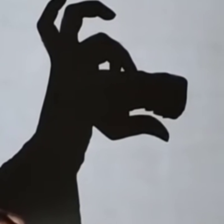

In [5]:
test_image = Image.open('/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_369.PNG').resize((224,224),2)
test_image

In [121]:
print(model1)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

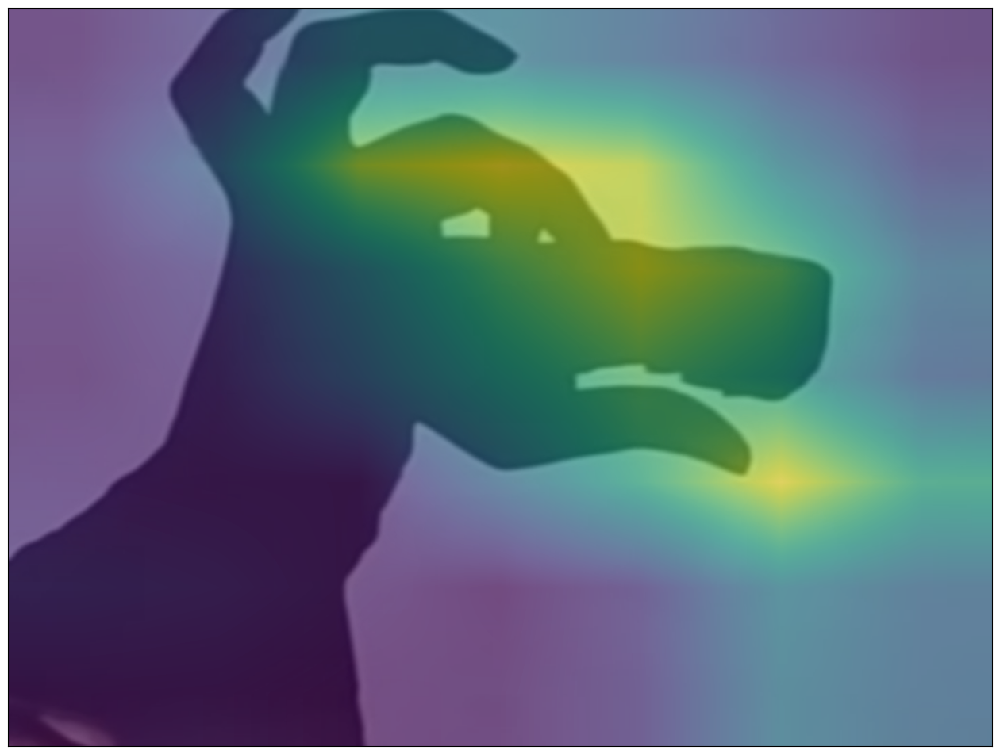

In [124]:
grad_cam(model1, model1.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_369.PNG', 5)

In [123]:
print(class_names)

['birdFrames', 'chickenFrames', 'cowFrames', 'crabFrames', 'deerFrames', 'dogFrames', 'elephantFrames', 'mooseFrames', 'pantherFrames', 'rabbitFrames', 'snailFrames']


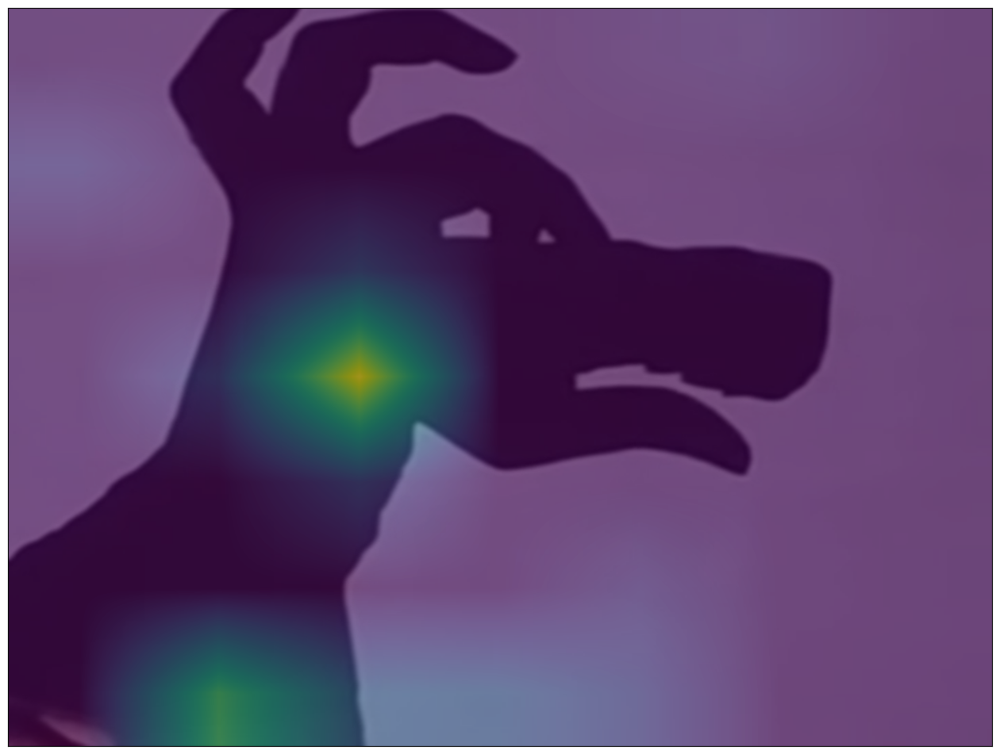

In [141]:
# grad_cam(model, model.classifier[4], '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_369.PNG', 5)
grad_cam(model, model.blocks[3].layers[1].layers.MBconv.layers.conv_c, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_369.PNG', 5)

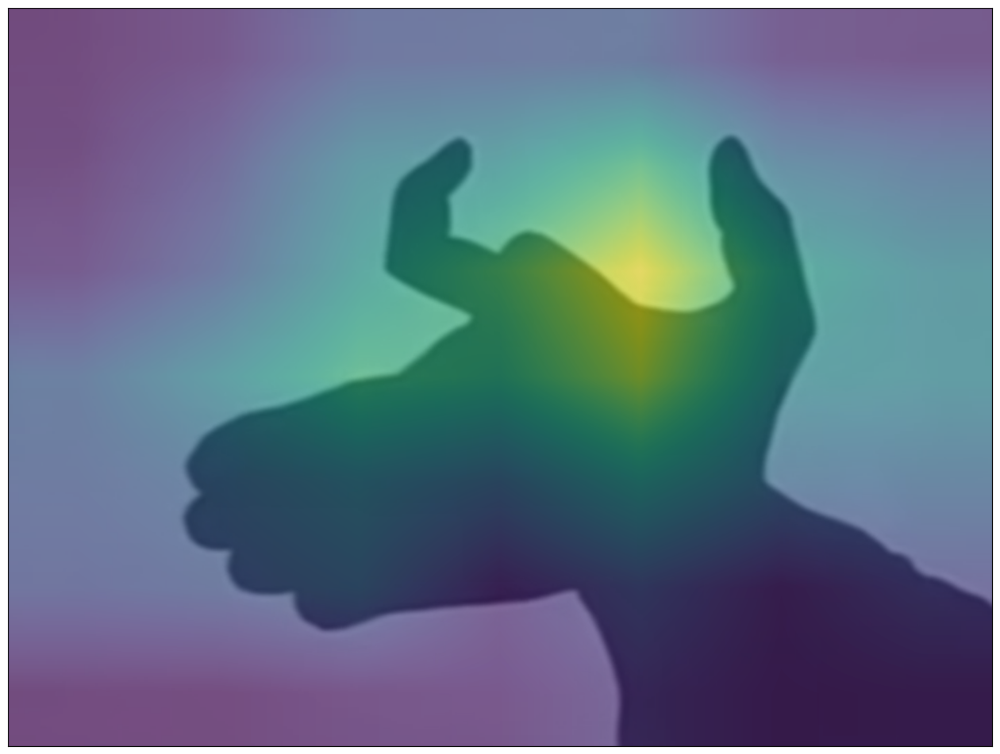

In [142]:
grad_cam(model1, model1.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/cowFrames/cow_269.PNG', 2)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


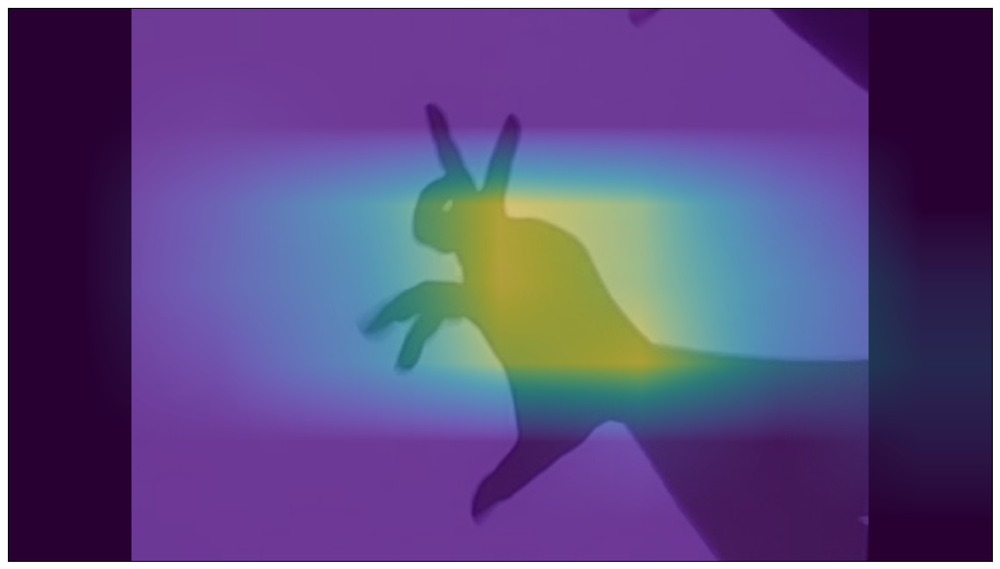

In [10]:
grad_cam(model1, model1.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/rabbitFrames/rabbit_514.PNG', 9)

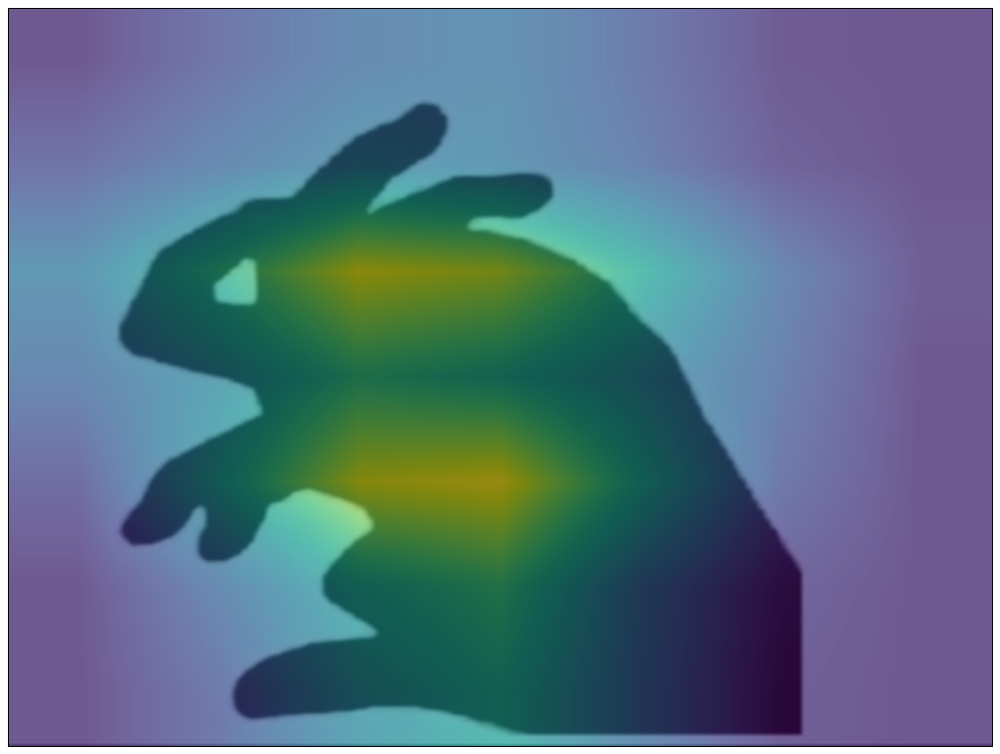

In [11]:
grad_cam(model1, model1.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/rabbitFrames/rabbit_454.PNG', 9)

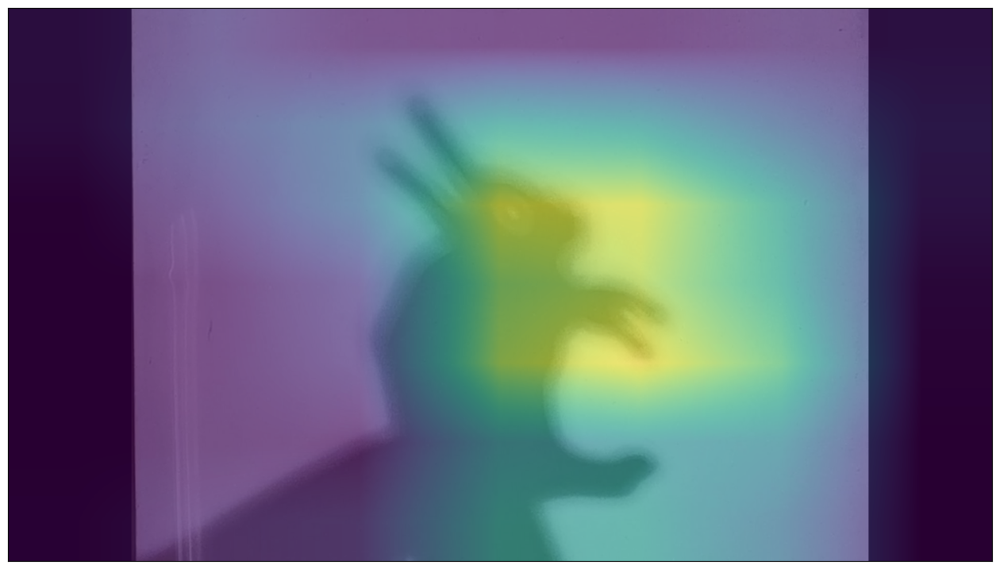

: 

In [12]:
grad_cam(model1, model1.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/rabbitFrames/rabbit_619.PNG', 9)

In [11]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(1))
print(torch.cuda.current_device())

True
NVIDIA GeForce RTX 3090
0


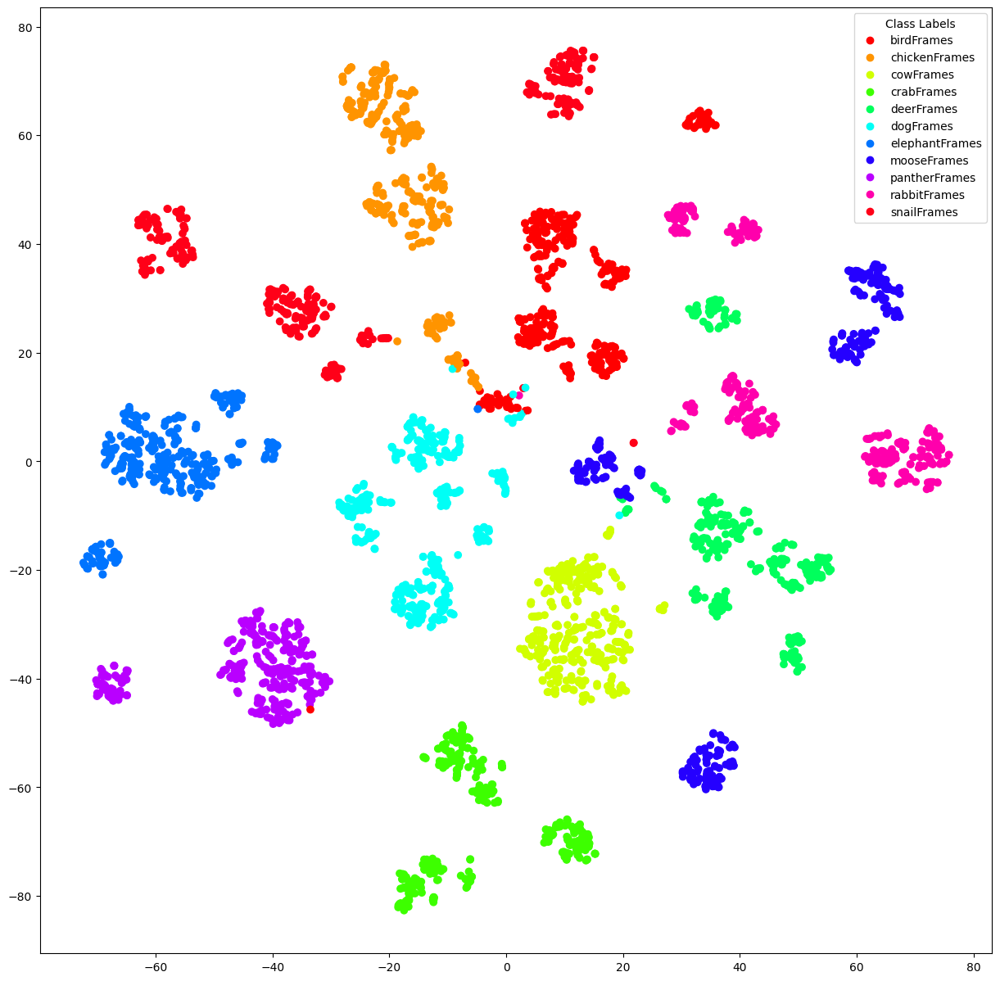

In [15]:
output_tsne_data = get_tsne(outputsList)
plot_representations(output_tsne_data, labelsList, class_names)

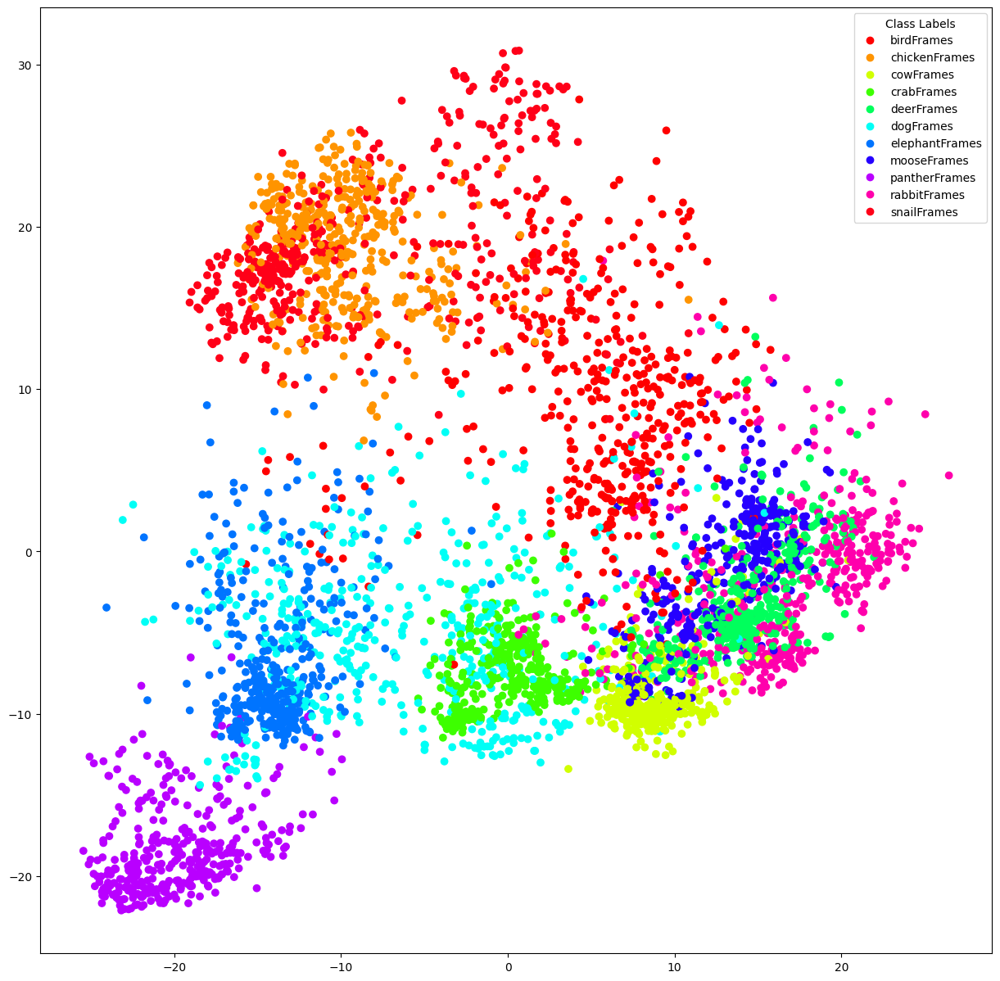

In [56]:
output_pca_data = get_pca(outputsList)
plot_representations(output_pca_data, labelsList, class_names)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


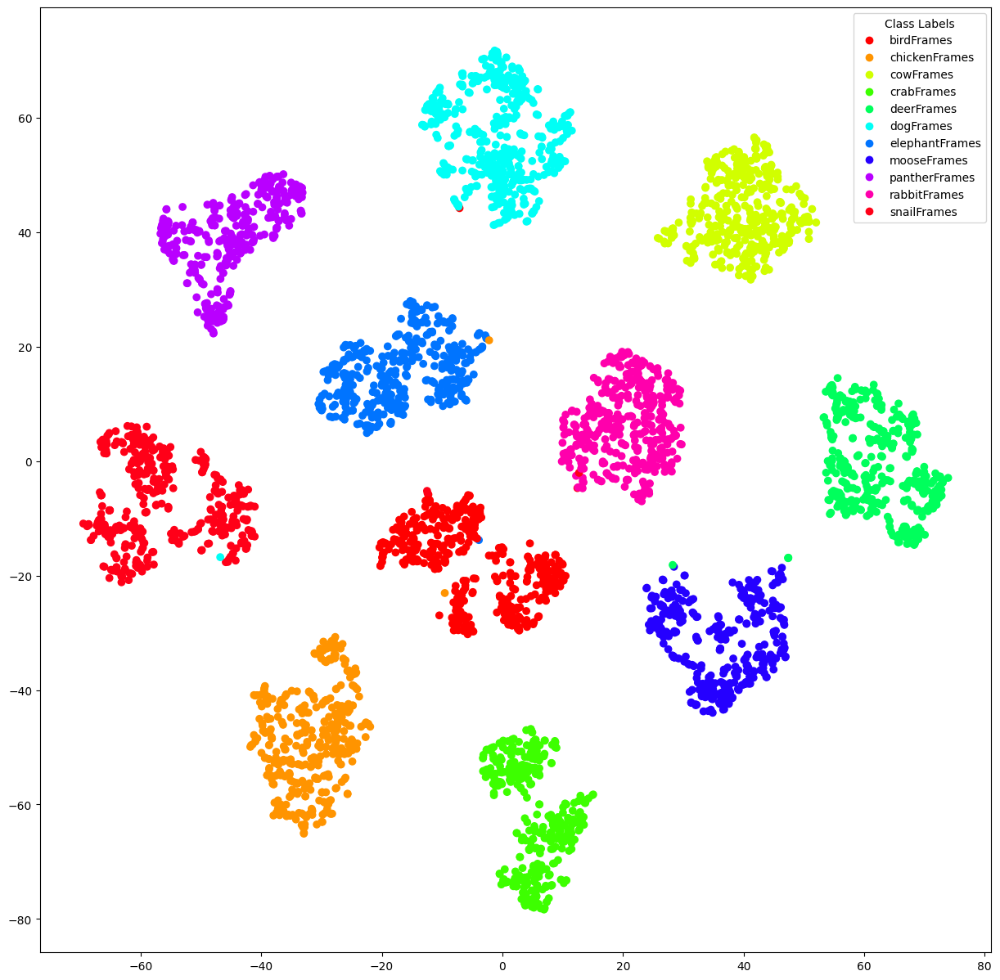

In [54]:
model2 = models.googlenet(pretrained=True)
num_ftrs2 = model2.fc.in_features
model2.fc = nn.Linear(num_ftrs2, 11)
loaded_model2 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_GoogLeNet.pt')
# print(loaded_model.keys())
model2.load_state_dict(loaded_model2, strict=False)
model2.eval().to(device)

outputsList2, labelsList2 = get_representations(model2, dataloaders['train'])

output_tsne_data2 = get_tsne(outputsList2)
plot_representations(output_tsne_data2, labelsList2, class_names)

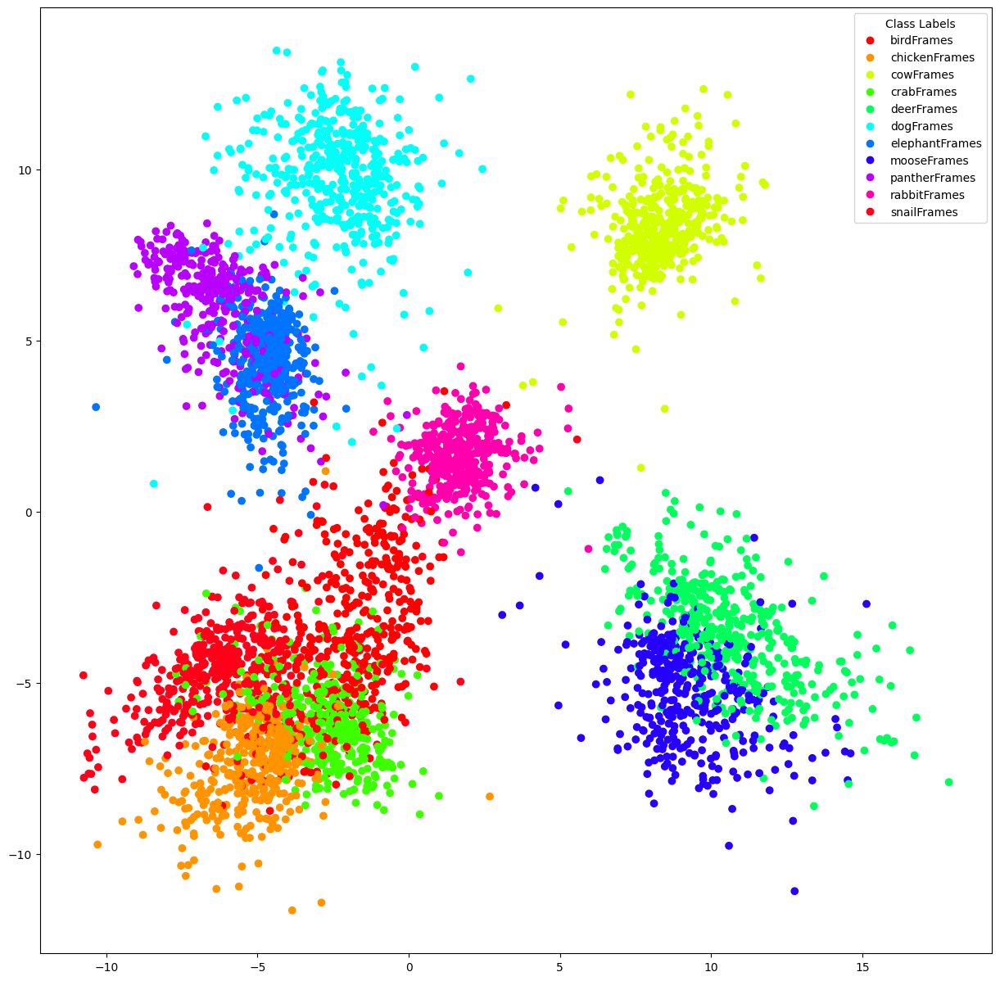

In [57]:
output_pca_data2 = get_pca(outputsList2)
plot_representations(output_pca_data2, labelsList2, class_names)

In [32]:
def visualize_modelGoogLeNet(model, num_images=6):
    was_training = model.training
    model.eval().to(device)
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
#             inputs = F.interpolate(inputs, size=(224,224), antialias=True, mode='bilinear')
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

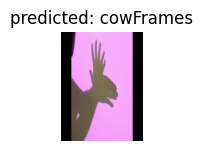

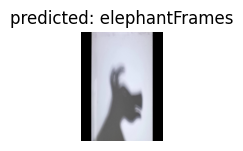

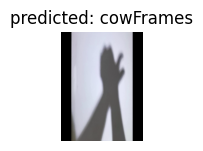

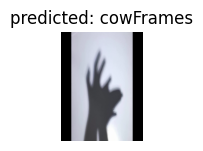

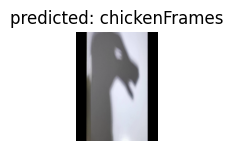

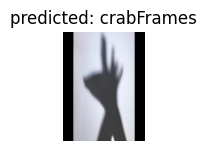

In [33]:
visualize_modelGoogLeNet(model2)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


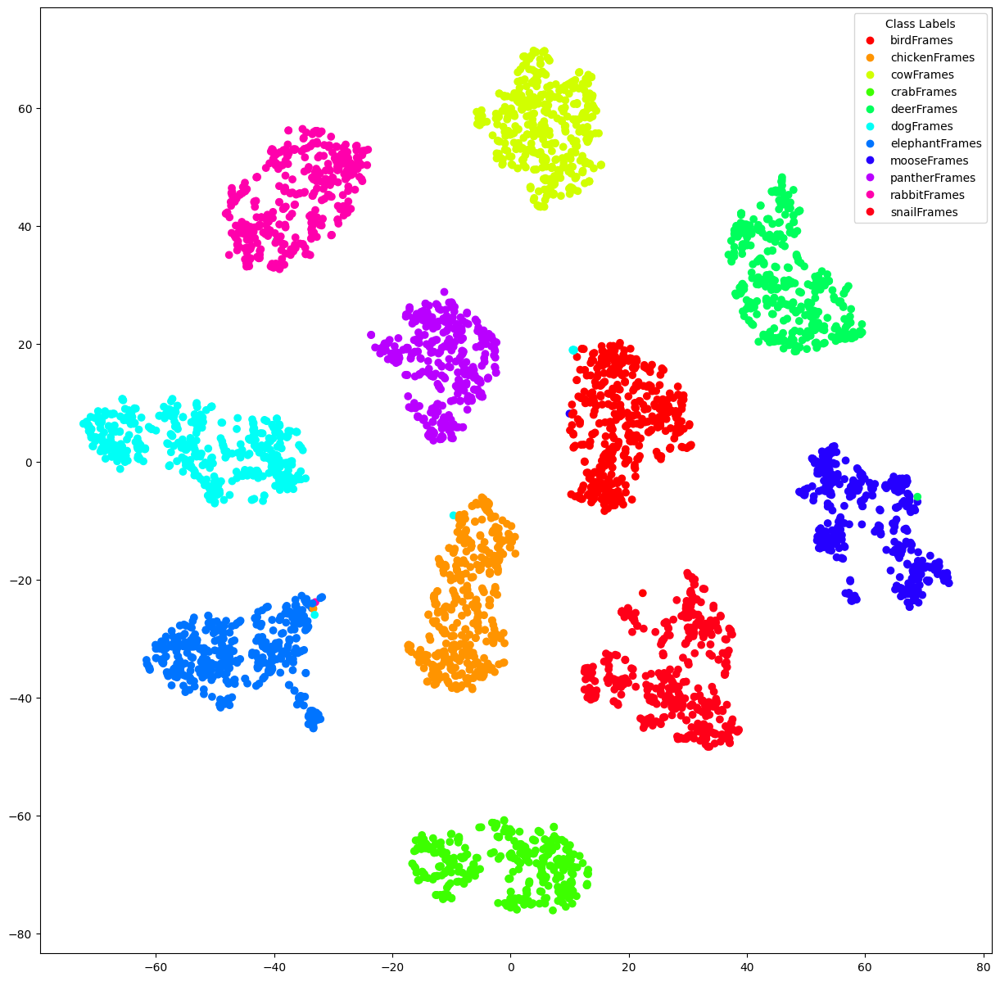

In [53]:
model3 = models.inception_v3(pretrained=True)
num_ftrs3 = model3.fc.in_features
model3.fc = nn.Linear(num_ftrs3, 11)
loaded_model3 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_InceptionV3.pt')
# print(loaded_model.keys())
model3.load_state_dict(loaded_model3, strict=False)
model3.eval().to(device)

outputsList3, labelsList3 = get_representations(model3, dataloaders['train'])

output_tsne_data3 = get_tsne(outputsList3)
plot_representations(output_tsne_data3, labelsList3, class_names)

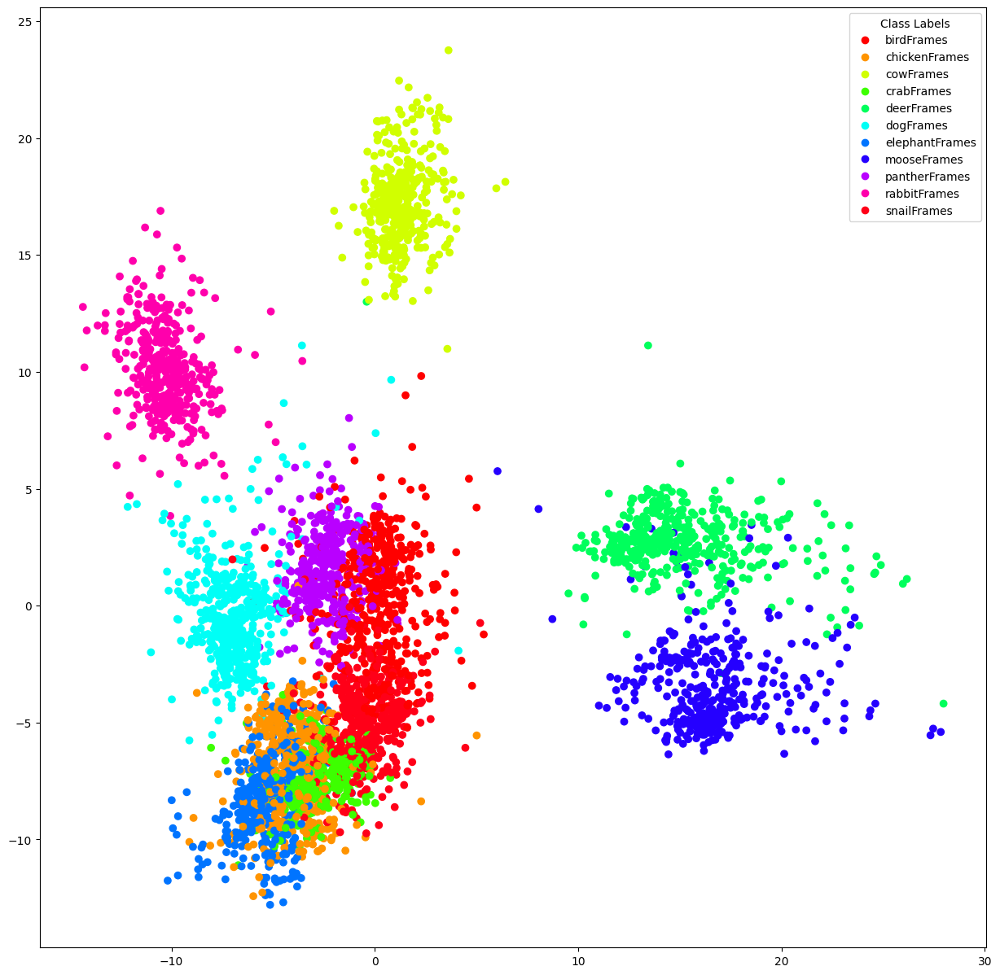

In [58]:
output_pca_data3 = get_pca(outputsList3)
plot_representations(output_pca_data3, labelsList3, class_names)

In [64]:
print(model3)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

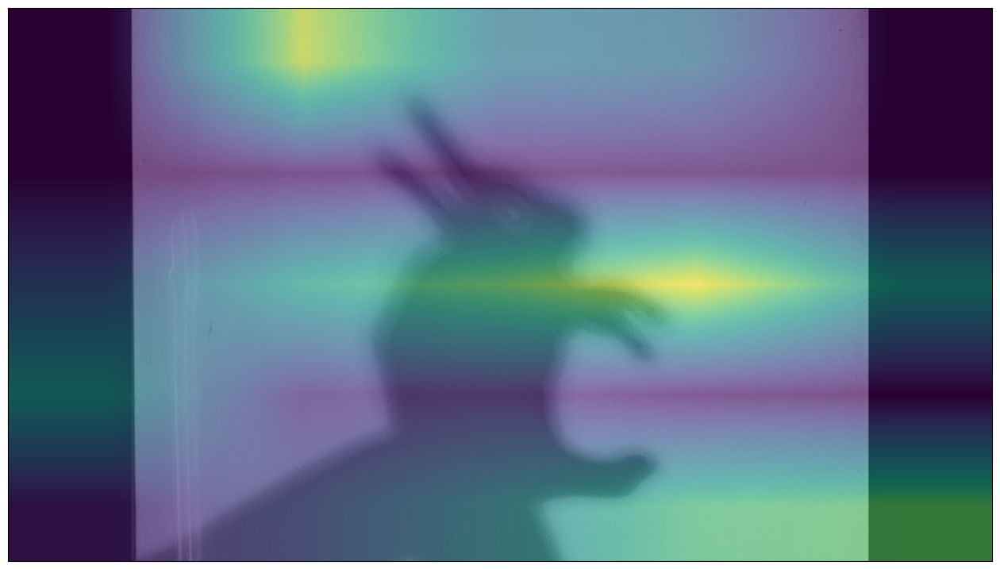

In [79]:
grad_cam(model3, model3.Mixed_7b.branch3x3dbl_3b.conv, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/rabbitFrames/rabbit_619.PNG', 9)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


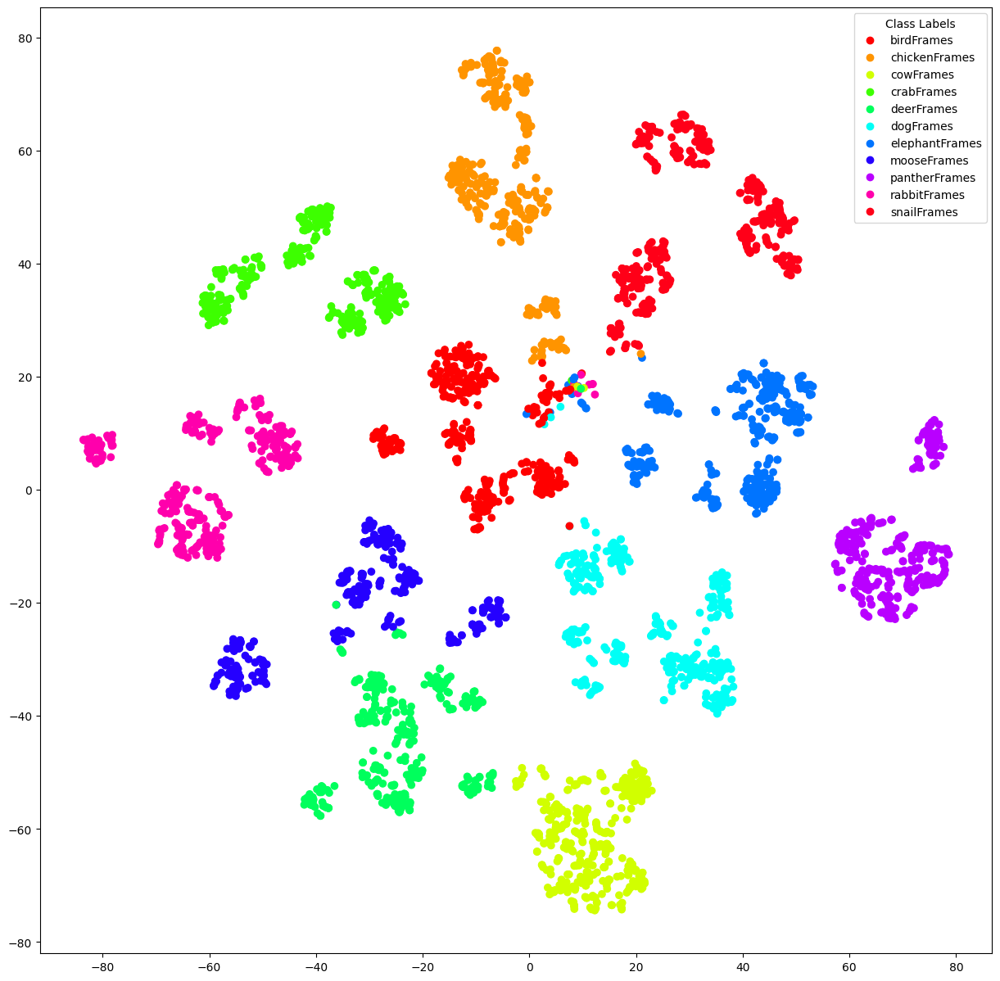

In [51]:
model4 = models.mobilenet_v3_large(pretrained=True)
num_ftrs4 = model4.classifier[3].in_features
model4.fc = nn.Linear(num_ftrs4, 11)
loaded_model4 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_MobileNetV3Large.pt')
# print(loaded_model.keys())
model4.load_state_dict(loaded_model4, strict=False)
model4.eval().to(device)

outputsList4, labelsList4 = get_representations(model4, dataloaders['train'])

output_tsne_data4 = get_tsne(outputsList4)
plot_representations(output_tsne_data4, labelsList4, class_names)

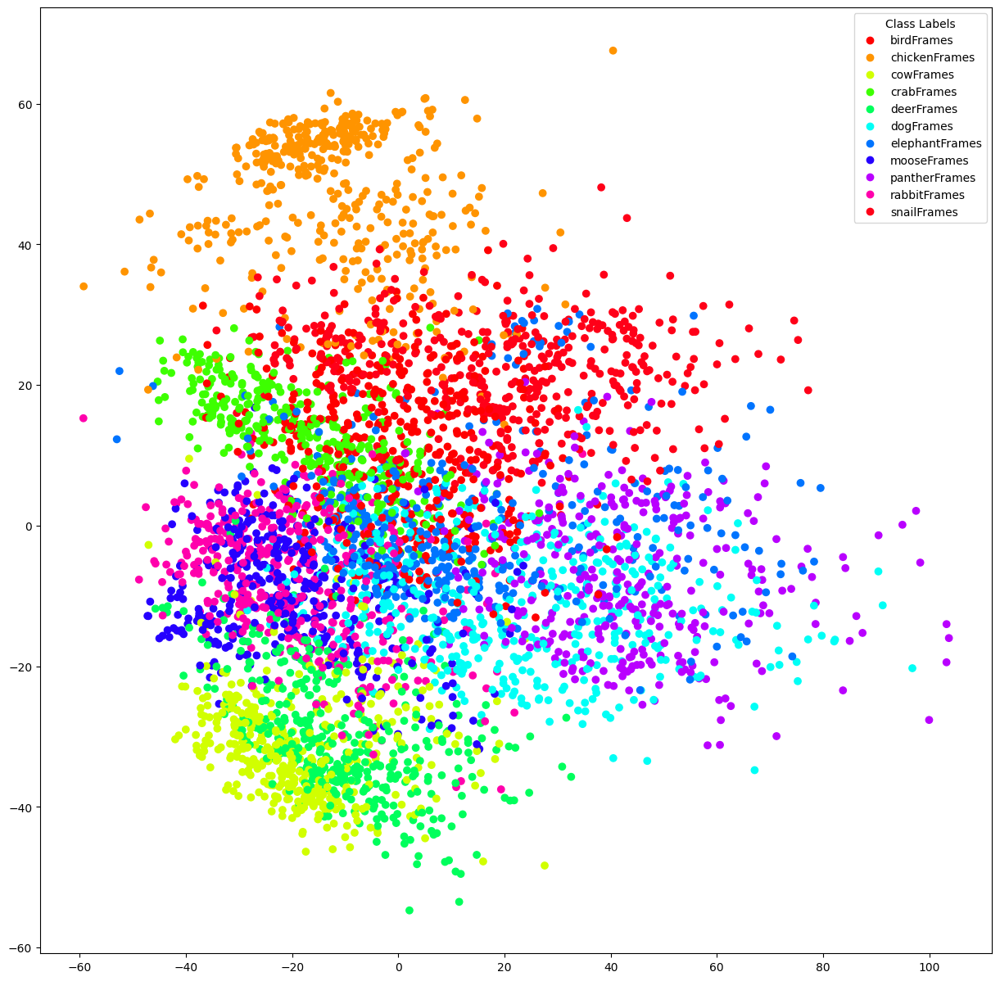

In [59]:
output_pca_data4 = get_pca(outputsList4)
plot_representations(output_pca_data4, labelsList4, class_names)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


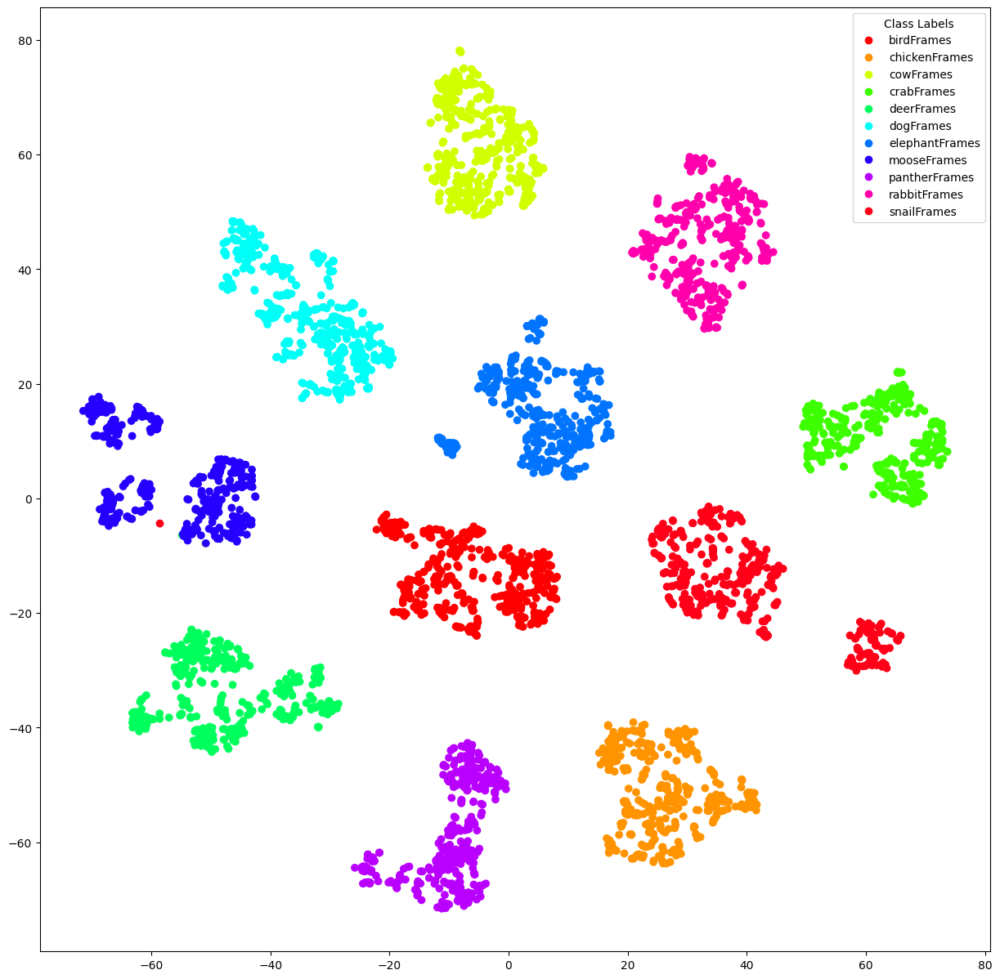

In [52]:
model5 = models.resnet152(pretrained=True)
num_ftrs5 = model5.fc.in_features
model5.fc = nn.Linear(num_ftrs5, 11)
loaded_model5 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_ResNet152_1.pt')
# print(loaded_model.keys())
model5.load_state_dict(loaded_model5, strict=False)
model5.eval().to(device)

outputsList5, labelsList5 = get_representations(model5, dataloaders['train'])

output_tsne_data5 = get_tsne(outputsList5)
plot_representations(output_tsne_data5, labelsList5, class_names)

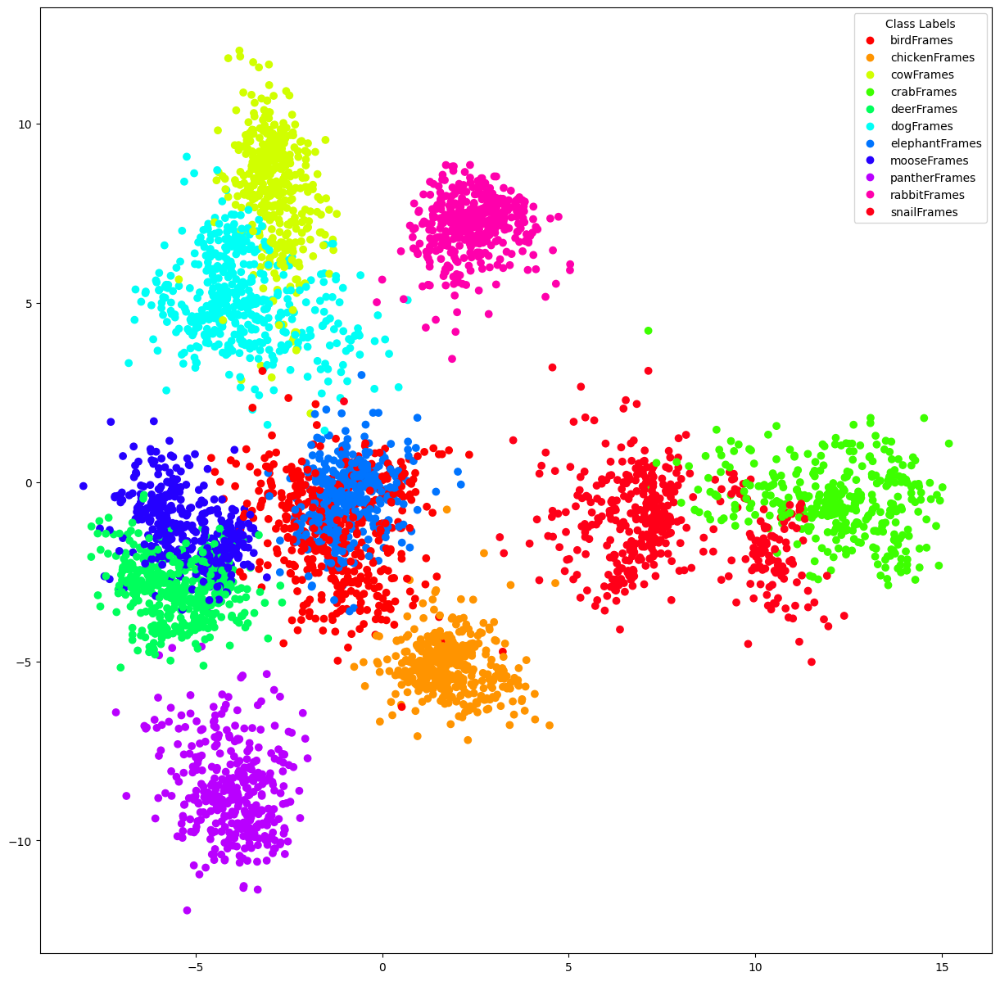

In [60]:
output_pca_data5 = get_pca(outputsList5)
plot_representations(output_pca_data5, labelsList5, class_names)

In [80]:
print(model5)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

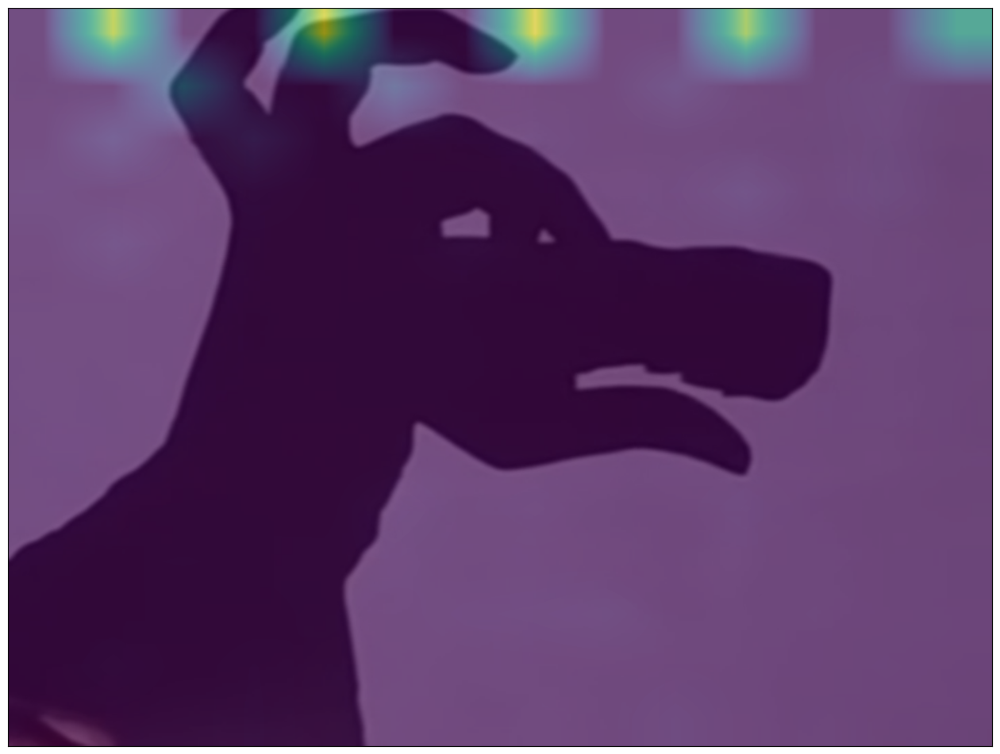

In [88]:
grad_cam(model5, model5.layer3[35].bn1, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_369.PNG', 5)

/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dlpc01/anaconda3/envs/rifat/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=RegNet_X_32GF_Weights.IMAGENET1K_V1`. You can also use `weights=RegNet_X_32GF_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


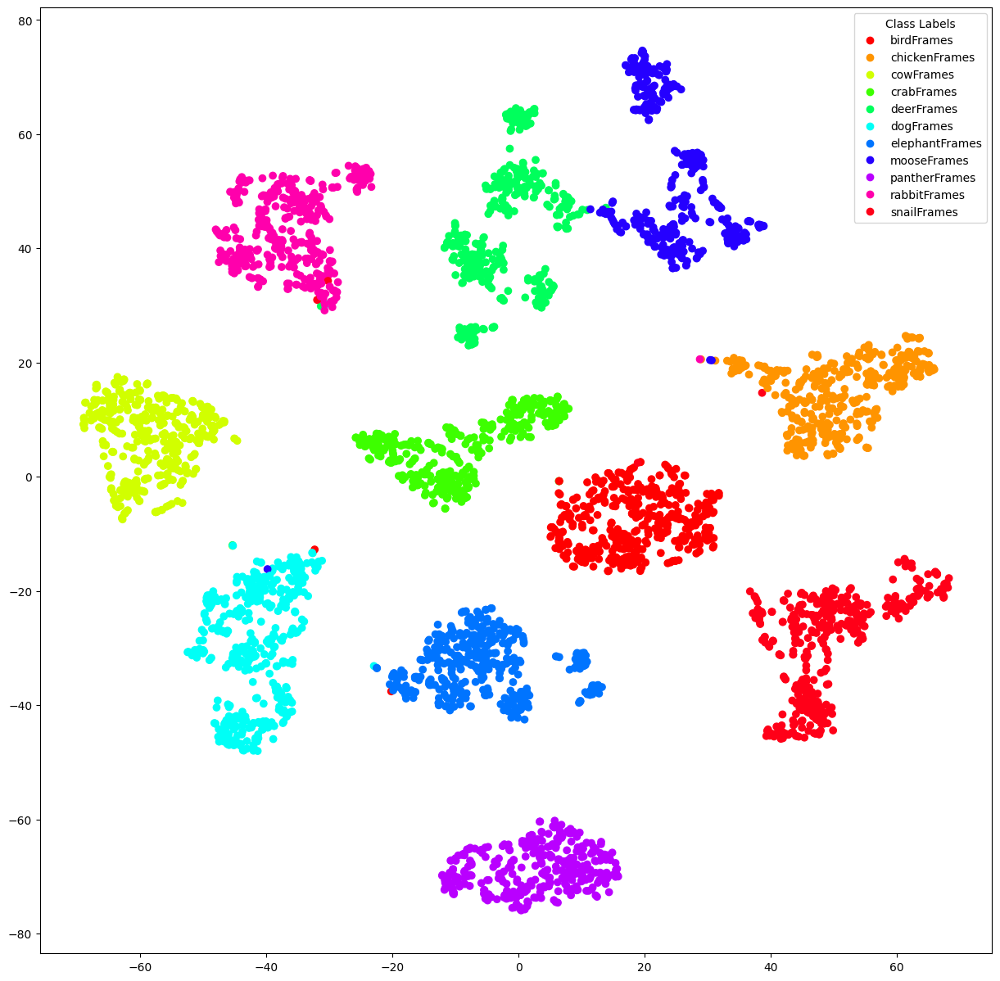

In [61]:
model6 = models.regnet_x_32gf(pretrained=True)
num_ftrs6 = model6.fc.in_features
model6.fc = nn.Linear(num_ftrs6, 11)
loaded_model6 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_RegNetX32GF.pt')
# print(loaded_model.keys())
model6.load_state_dict(loaded_model6, strict=False)
model6.eval().to(device)

outputsList6, labelsList6 = get_representations(model6, dataloaders['train'])

output_tsne_data6 = get_tsne(outputsList6)
plot_representations(output_tsne_data6, labelsList6, class_names)

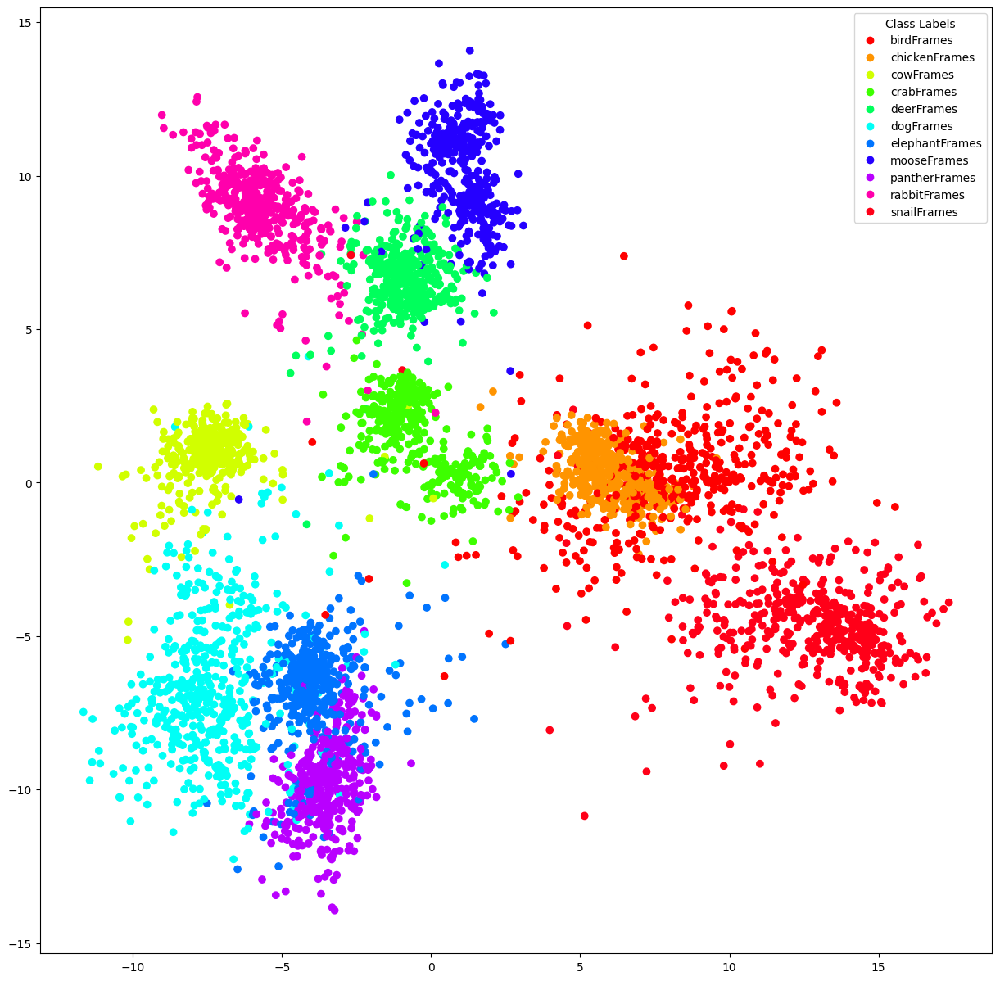

In [62]:
output_pca_data6 = get_pca(outputsList6)
plot_representations(output_pca_data6, labelsList6, class_names)

In [90]:
model7 = models.densenet201(pretrained=True)
num_ftrs7 = model7.classifier.in_features
model7.fc = nn.Linear(num_ftrs7, 11)
loaded_model7 = torch.load('/home/dlpc01/Rifat/saved_models/HSPR_DenseNet201_1.pt')
# print(loaded_model.keys())
model7.load_state_dict(loaded_model7, strict=False)
model7.eval().to(device)

# outputsList6, labelsList6 = get_representations(model6, dataloaders['train'])

# output_tsne_data6 = get_tsne(outputsList6)
# plot_representations(output_tsne_data6, labelsList6, class_names)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

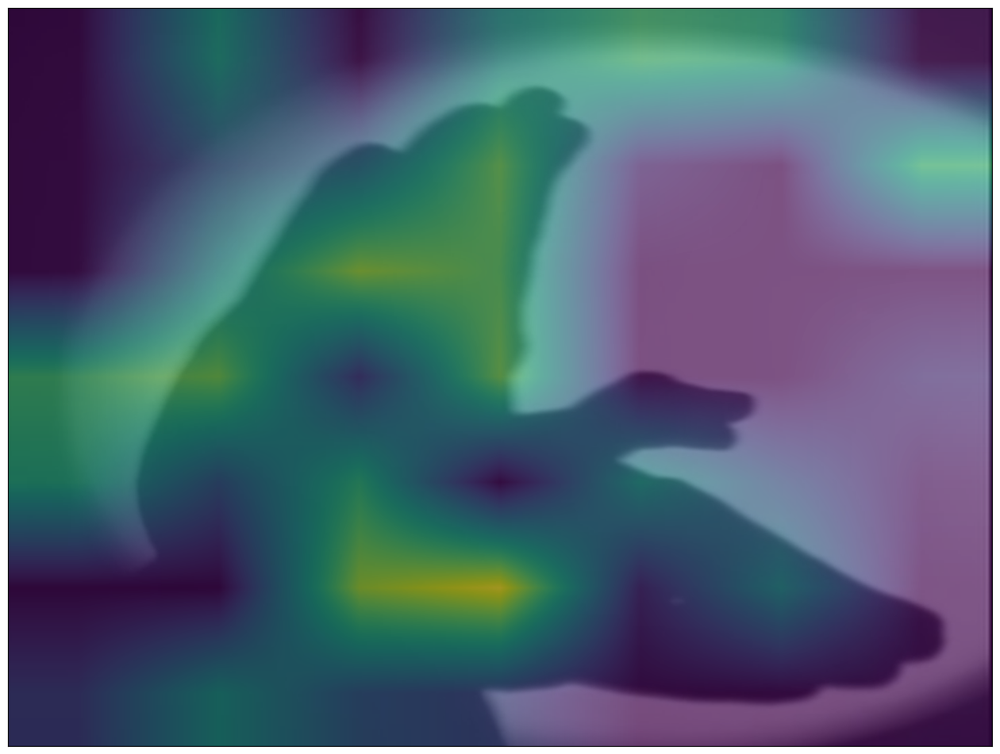

In [115]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/birdFrames/bird_224.PNG', 0)

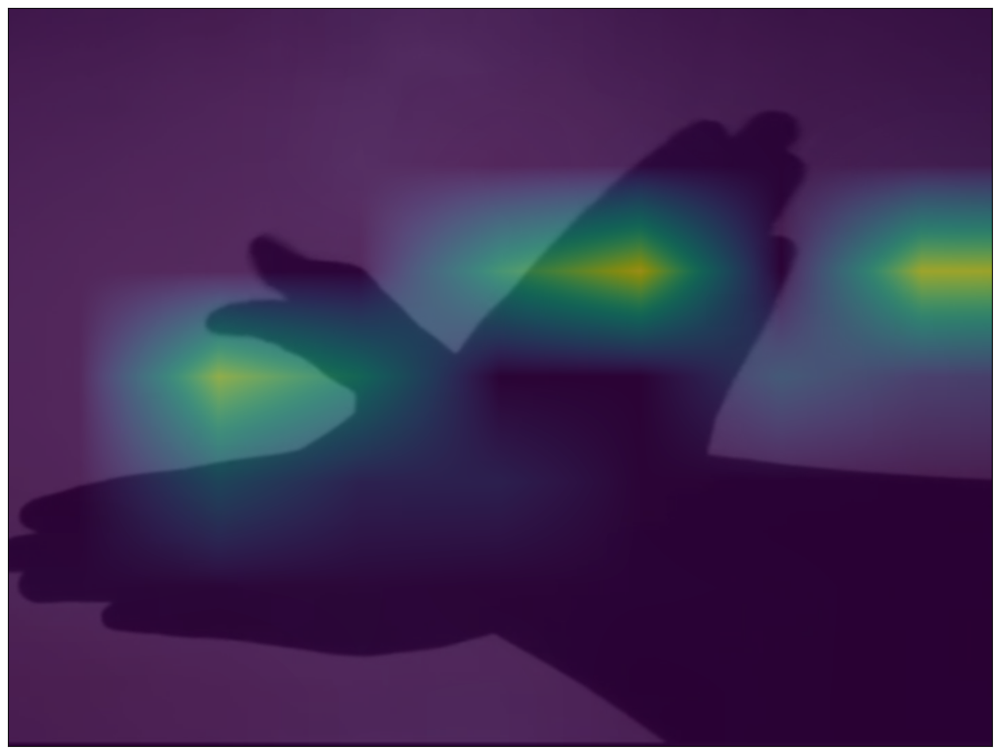

In [152]:
grad_cam(model7, model7.features.denseblock4.denselayer3.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/birdFrames/bird_489.PNG', 0)

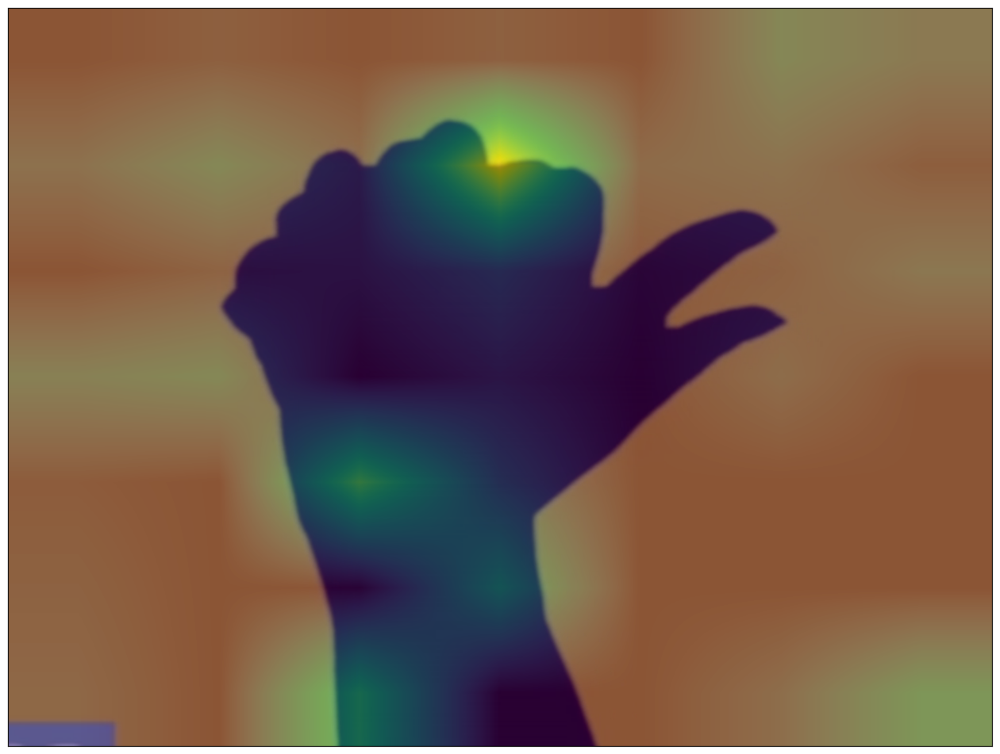

In [128]:
grad_cam(model7, model7.features.denseblock4.denselayer20.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/chickenFrames/chicken_498.PNG', 1)

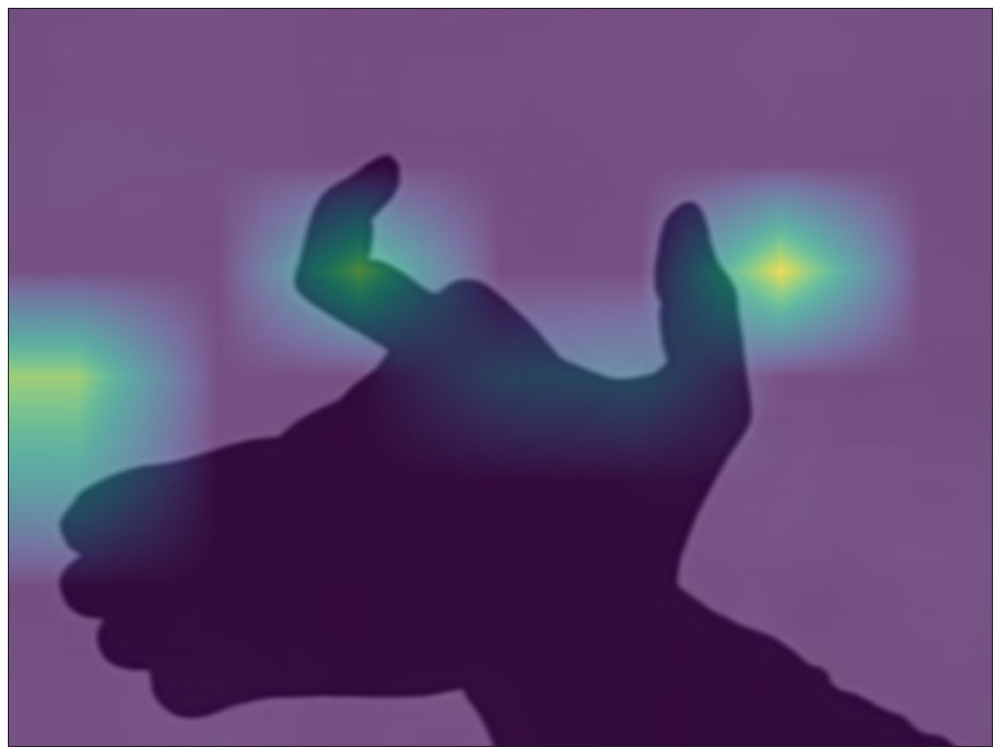

In [157]:
grad_cam(model7, model7.features.denseblock4.denselayer20.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/cowFrames/cow_35.PNG', 2)

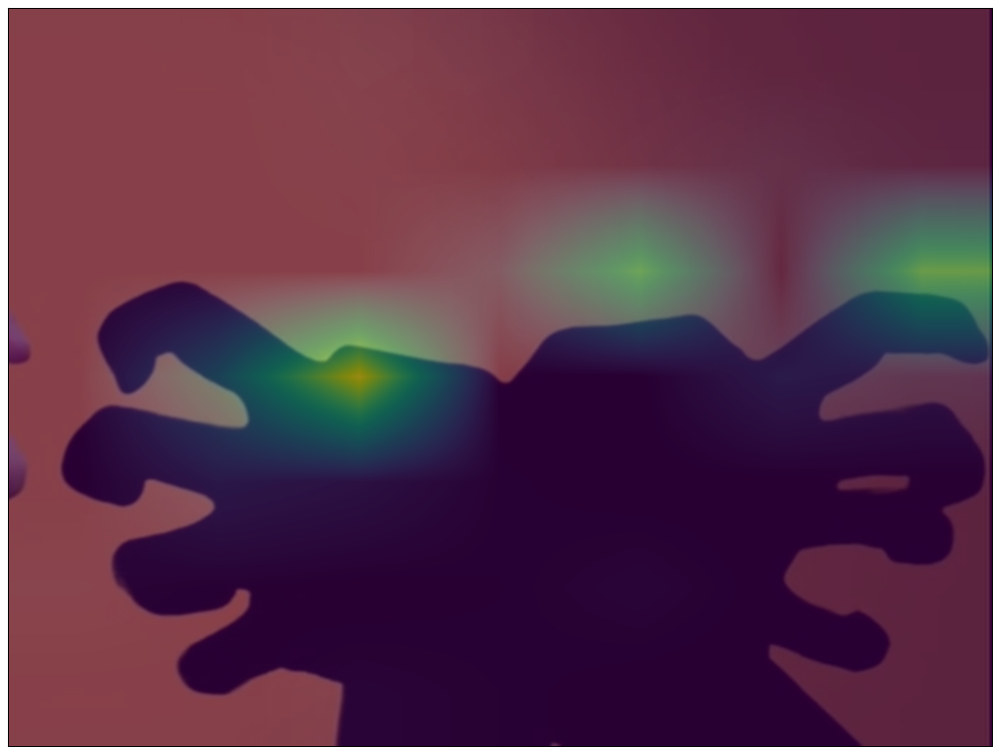

In [170]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/crabFrames/crab_93.PNG', 3)

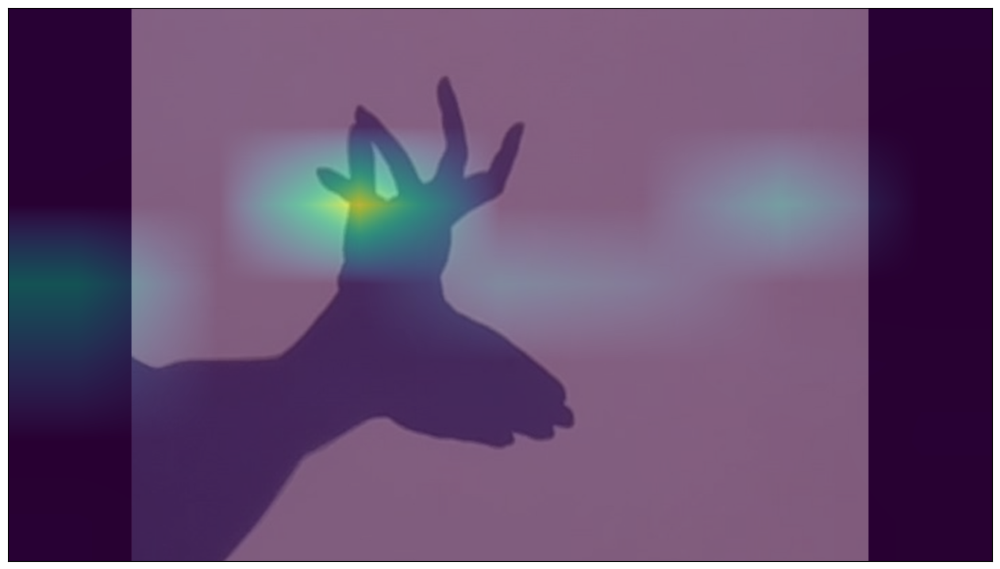

In [174]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/deerFrames/deer_609.PNG', 4)

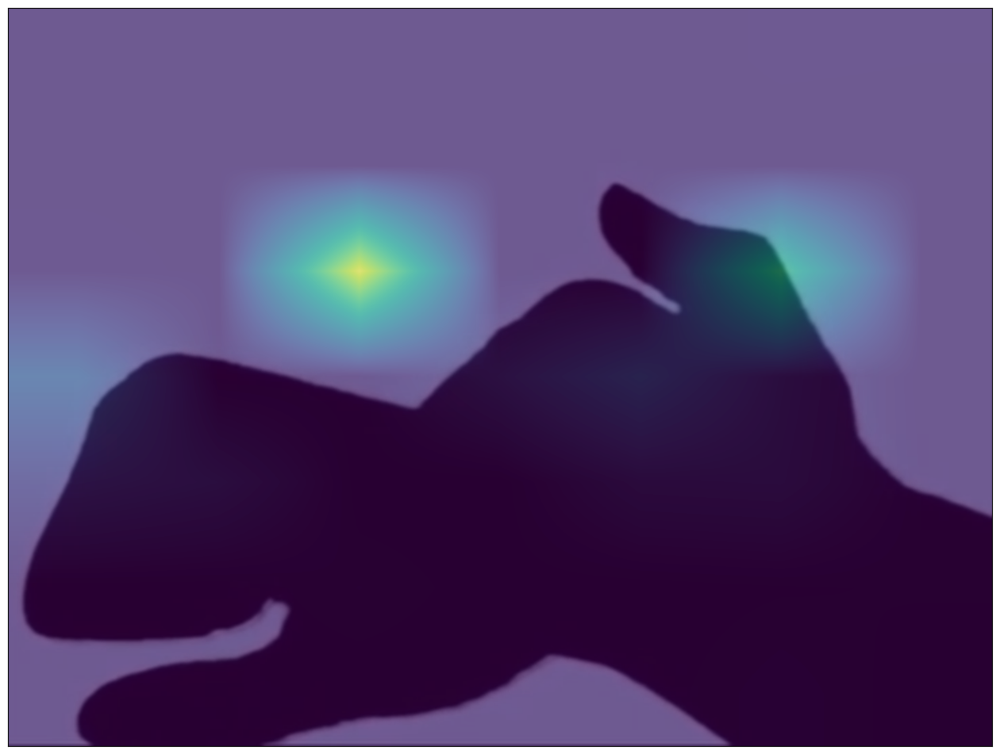

In [187]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/dogFrames/dog_434.PNG', 5)

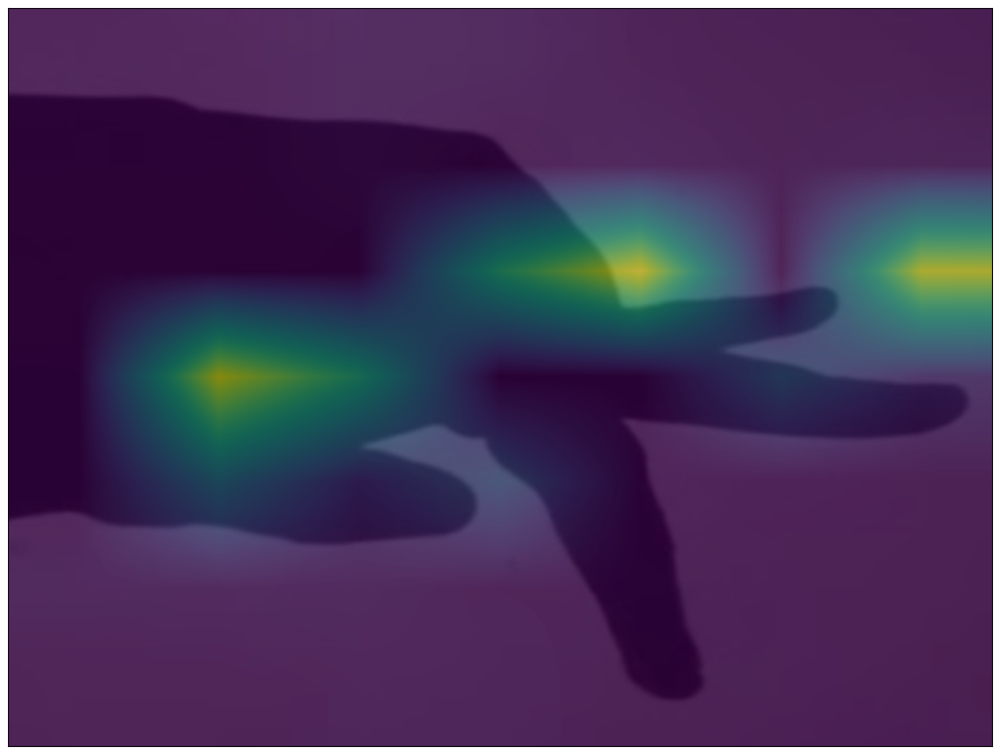

In [194]:
grad_cam(model7, model7.features.denseblock4.denselayer30.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/elephantFrames/elephant_471.PNG', 6)

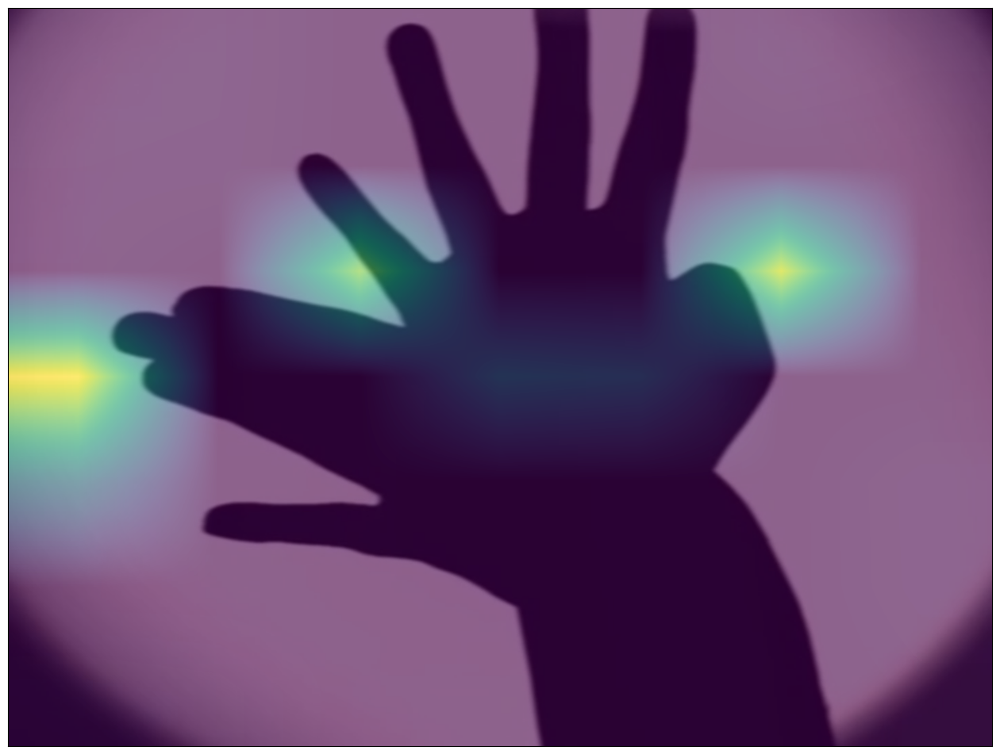

In [206]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/mooseFrames/moose_11.PNG', 7)

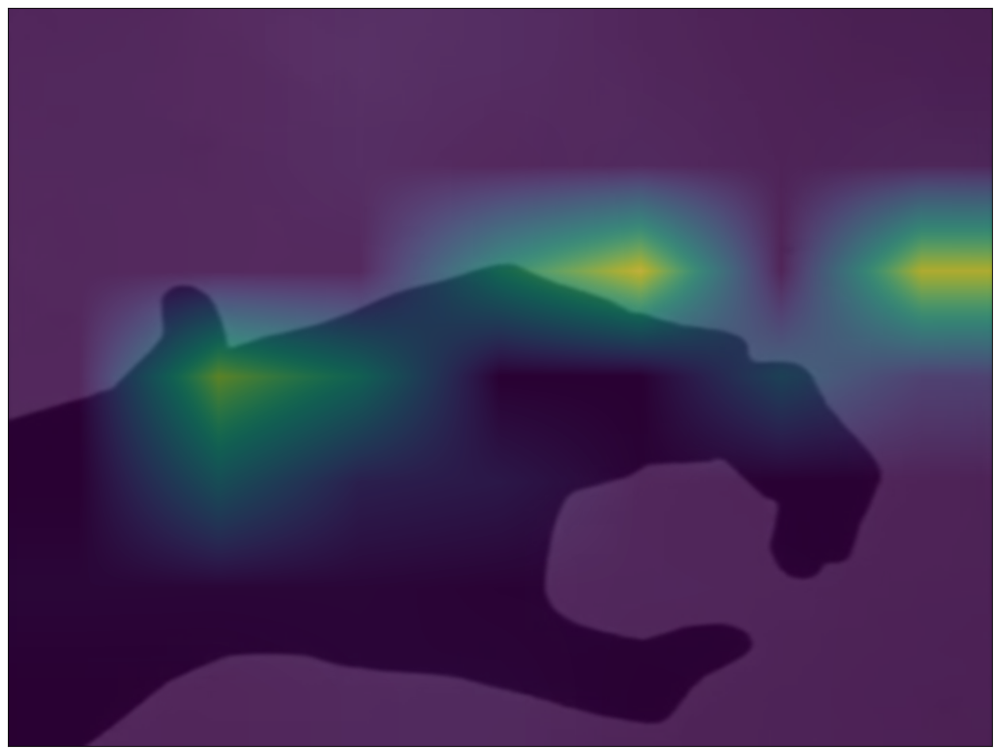

In [213]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/pantherFrames/panther_397.PNG', 8)

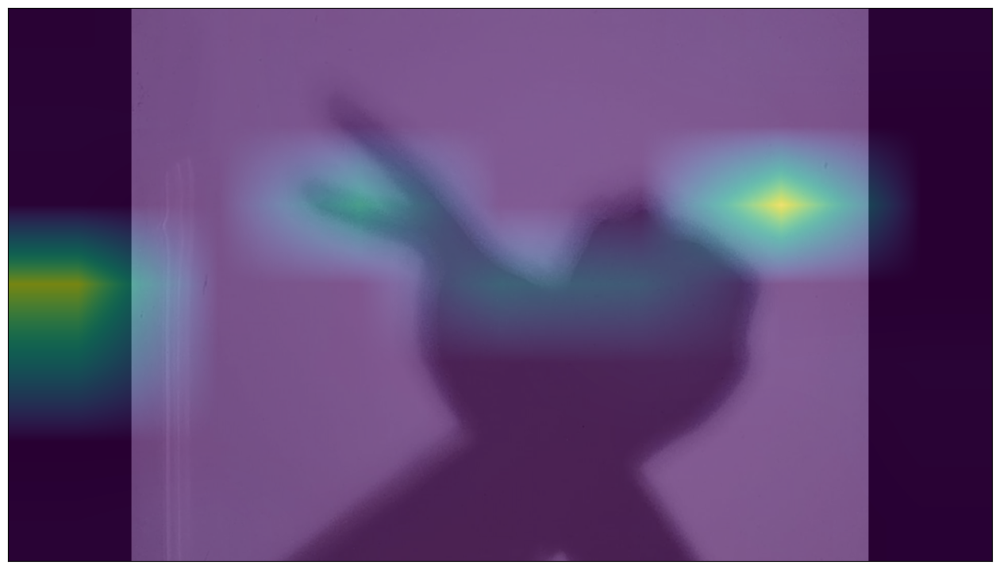

In [222]:
grad_cam(model7, model7.features.denseblock4.denselayer32.conv2, '/home/dlpc01/Rifat/CSE 4836 Pattern Recognition Lab/data2/val/snailFrames/snail_701.PNG', 10)